In [1]:
import emcee
import matplotlib.pyplot as plt
import pyccl as ccl
import numpy as np
import corner
from IPython.display import display, Math
import matplotlib.colors as mcolors
import matplotlib
from scipy.stats import norm
from nautilus import Sampler, Prior
import h5py
import getdist.plots
import matplotlib.pyplot as plt
import yaml
import sys
import os
# Plot style
import seaborn as sns
sns.set_theme(style="ticks")
sns.set_palette(sns.color_palette("Paired"))

from matplotlib import rc
rc('text', usetex=False)
#rc('font',**{'family':'serif','serif':['Times']})

plt.rc('mathtext', fontset='stix')
plt.rc('xtick',labelsize=20)
plt.rc('ytick',labelsize=20)
plt.rc('font',size=20)
plt.rc('axes', titlesize=25)
plt.rc('axes', labelsize=20)
plt.rc('lines', linewidth=3)
plt.rc('lines', markersize=6)
plt.rc('legend', fontsize=18)

### Convergence tests

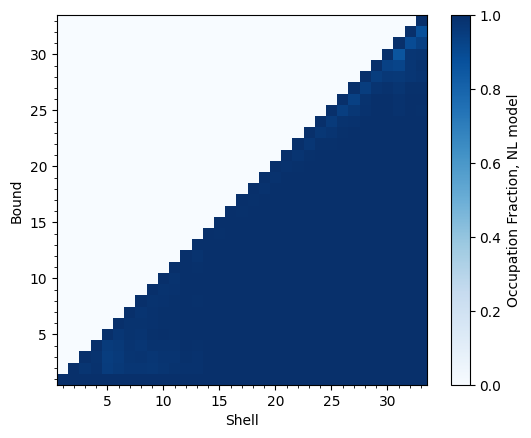

In [126]:
def log_probability_function(pars):
    return
prior = Prior()
prior.add_parameter("x", dist=norm(0,1))
prior.add_parameter("y", dist=norm(0,1))

sampler = Sampler(prior, log_probability_function,
                  filepath='/home/c2042999/MGLensing/pca_emcee_runs/chains/hdf5/lsst_y1_NLmodel.hdf5', resume=True)

occ = sampler.shell_bound_occupation()

plt.imshow(occ.T, origin='lower', cmap='Blues',
           extent=(0.5, len(occ) + 0.5, 0.5, len(occ) + 0.5))
plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(1))
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(1))
plt.xlabel('Shell')
plt.ylabel('Bound')
cb = plt.colorbar()
cb.set_label('Occupation Fraction, NL model')

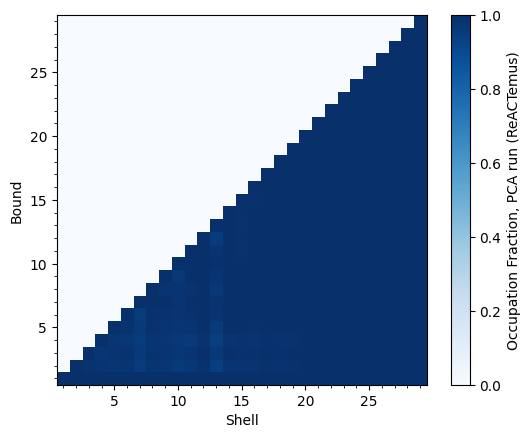

In [127]:
sampler = Sampler(prior, log_probability_function,
                  filepath='/home/c2042999/MGLensing/pca_emcee_runs/chains/hdf5/lsst_y1_pcacuts_ReACTemus.hdf5', resume=True)

occ = sampler.shell_bound_occupation()

plt.imshow(occ.T, origin='lower', cmap='Blues',
           extent=(0.5, len(occ) + 0.5, 0.5, len(occ) + 0.5))
plt.gca().xaxis.set_minor_locator(plt.MultipleLocator(1))
plt.gca().yaxis.set_minor_locator(plt.MultipleLocator(1))
plt.xlabel('Shell')
plt.ylabel('Bound')
cb = plt.colorbar()
cb.set_label('Occupation Fraction, PCA run (ReACTemus)')

### Defining plotting functions

In [82]:
os.chdir('/home/c2042999/MGLensing/')

with open("pca_emcee_runs/params_names.yaml", "r") as file:
    params_dic = yaml.safe_load(file)


def read_last_header_line(file_path):
    last_header = None
    with open(file_path, 'r', encoding='utf-8') as file:
        for line in file:
            if line.startswith('#'):
                last_header = line.strip('#').strip()  
            else:
                break  

    if last_header:
        return last_header.split() 
    else:
        return []



def extract_info_from_header(file_paths):
    n_samples = len(file_paths)
    chains_info = {}
    for i in range(n_samples):
        file_path = file_paths[i]  
        chain = np.genfromtxt(file_path)
        chain_pars = read_last_header_line(file_path)

        chain_header = []
        with open(file_path, 'r', encoding='utf-8') as file:
            for line in file:
                if line.startswith('#'):
                    chain_header.append(line.strip('#').strip())  
                else:
                    break
        
        # save chain and parameter names
        chain_pars = chain_pars[:-2]
        chains_info[i] = {}
        chains_info[i]['chain'] = chain
        chains_info[i]['pars'] = chain_pars

        # save whether it is 3x2pt or shear-only from header info
        if any("Observable: shear-shear" in line for line in chain_header):
            chains_info[i]['observable'] = 'shear-shear'
        elif any("Observable: WL+XC+GC" in line for line in chain_header):
            chains_info[i]['observable'] = '3x2pt'
        else:
            raise ValueError("Observable type not found in header")
        
        # save ell_max WL,GC from header info (kmax not implemented)
        for line in chain_header:
            if "cut in l_max (WL)" in line:
                wl_lmax = [float(x) for x in line.split(":")[1].strip().strip("[]").split(",")]
                chains_info[i]['wl_lmax'] = max(wl_lmax)
            if "cut in l_max (GC, XC)" in line:
                gc_lmax = [float(x) for x in line.split(":")[1].strip().strip("[]").split(",")]
                chains_info[i]['gc_lmax'] = max(gc_lmax)

        # save Sky Fraction (fsky) and survey info
        for line in chain_header:
            if "Sky Fraction (fsky):" in line:
                chains_info[i]['fsky'] = float(line.split(":")[1].strip())
            if "for n(z)" in line:
                chains_info[i]['survey'] = line.split("z) ")[1].strip()


        # save Datavector model name, by looking at two lines: # Data Model:
    #             #   - Nonlinear Power Spectrum: HMcode (0)
        for j, line in enumerate(chain_header):
            if "Data Model:" in line:
                model_name = chain_header[j+1].split(":", 1)[1].strip()
                chains_info[i]['datavector_model'] = model_name
            if "Theory Model:" in line:
                model_name = chain_header[j+1].split(":", 1)[1].strip()
                chains_info[i]['model'] = model_name
        # save fiducial values from header info.
        # These are found in the lines after "Parameters:" and are in the format
        #  "param1=value1, 
        # param2=value2, ..."
        # ending with #         #
        for j, line in enumerate(chain_header):
            if "Parameters:" in line:
                # find number of parameters listed, by counting lines until we reach a line that contains "Theory Model:"
                n_params = 0
                for k in range(j+1, len(chain_header)):
                    if "Theory Model:" in chain_header[k]:
                        break
                    n_params += 1
                fid_line = chain_header[j+1:j+n_params+1]
                fid_values = {}
                for item in fid_line:
                    if ":" in item:
                        _ , cleaned_item = item.split("- ")
                        param, value = cleaned_item.split(":")
                        fid_values[param.strip()] = float(value.strip())
                # keep fid values only for the parameters in the chain. If there is no fiducial for the given parameter, leave None.
                fid_values = {param: fid_values.get(param, None) for param in chains_info[i]['pars']}
                chains_info[i]['fiducials'] = fid_values
        #print(f"Chain {i} parameters: {chains_info[i]['pars']}")
        #print(f"Chain {i} observable type: {chains_info[i]['observable']}")
        #print(f"Chain {i} wl_lmax: {chains_info[i]['wl_lmax']}")
        #print(f"Chain {i} gc_lmax: {chains_info[i]['gc_lmax']}")
        #print(f"Chain {i} fsky: {chains_info[i]['fsky']}")
        #print(f"Chain {i} survey: {chains_info[i]['survey']}")
        #print(f"Chain {i} fiducials: {chains_info[i]['fiducials']}")
        #print(f"Chain {i} model: {chains_info[i]['model']}")
    return chains_info


def plot_corner(file_paths, additional_labels=None, title=None):
    n_samples = len(file_paths)   
    chains_info = extract_info_from_header(file_paths) 
    samples = []

    for i in range(n_samples):
        samples.append(
            getdist.MCSamples(samples = chains_info[i]['chain'][:,:len(chains_info[i]['pars'])],
                                        names = [i for i in chains_info[i]['pars']],
                                        weights=np.exp(chains_info[i]['chain'][:, -2]),
                                        labels = [params_dic[p]
                                                    for p in chains_info[i]['pars']],
                                        settings={'smooth_scale_2D':0.35, 'smooth_scale_1D':0.35},
                                        ) 
        )
    # choose Model Pars so that they include all params from all chains
    ModelPars = set()
    for i in range(n_samples):
        ModelPars.update(chains_info[i]['pars'])
    ModelPars = list(ModelPars)

    colors = [ '#18698F', '#7AC011', '#FF7083', '#99D4E5']
    g = getdist.plots.getSubplotPlotter(subplot_size=1.5)

    plt.rcParams.update({'font.size':16})
    g.settings.legend_fontsize=20
    g.settings.axes_fontsize=18
    g.settings.axes_labelsize=20
    g.settings.linewidth=4   
    g.settings.figure_legend_frame = False

    ###
    #legend_labels = []
    # annotation_text = 'LSST Y1 data \n 3x2pt-analysis\n $\ell^{\\rm WL, GC}_{\\rm max}=2000, 100$'

    ### Find legend labels and annotation text. If observable type,  wl_lmax, gc_lmax, fsky, survey 
    ### are the same across chains, use them to create annotation text. Otherwise, use them in label for each chain
    legend_labels = [] if additional_labels is None else additional_labels
    annotation_text = ""
    observable_types = set()
    wl_lmax_values = set()
    gc_lmax_values = set()
    fsky_values = set()
    survey_values = set()
    model_names = set()
    datavector_model_names = set()
    for i in range(n_samples):
        observable_types.add(chains_info[i]['observable'])
        wl_lmax_values.add(chains_info[i]['wl_lmax'])
        gc_lmax_values.add(chains_info[i]['gc_lmax'])
        fsky_values.add(chains_info[i]['fsky'])
        survey_values.add(chains_info[i]['survey'])
        model_names.add(chains_info[i]['model'])    
        datavector_model_names.add(chains_info[i]['datavector_model'])
    if len(observable_types) == 1:
        annotation_text += f"{observable_types} \n"
    else:
        if legend_labels == []:
            for i in range(n_samples):
                legend_labels.append(f"{chains_info[i]['observable']}")
        else:
            for i in range(n_samples):
                legend_labels[i] += f"{chains_info[i]['observable']}"
    if len(wl_lmax_values) == 1:
        annotation_text += f"$\ell^{{\\rm WL}}_{{\\rm max}}={wl_lmax_values}$, "
    else:
        if legend_labels == []:
            for i in range(n_samples):
                legend_labels.append(f"$\ell^{{\\rm WL}}_{{\\rm max}}={chains_info[i]['wl_lmax']}$")
        else:
            for i in range(n_samples):
                legend_labels[i] += f", $\ell^{{\\rm WL}}_{{\\rm max}}={chains_info[i]['wl_lmax']}$"
    # if shear-shear, ignore this
    if "shear-shear" in observable_types and len(observable_types) == 1:
        pass
    else:
        if len(gc_lmax_values) == 1:
            annotation_text += f"$\ell^{{\\rm GC}}_{{\\rm max}}={gc_lmax_values}$, "
        else:
            if legend_labels == []:
                for i in range(n_samples):
                    legend_labels.append(f"$\ell^{{\\rm GC}}_{{\\rm max}}={chains_info[i]['gc_lmax']}$")
            else:
                for i in range(n_samples):
                    legend_labels[i] += f", $\ell^{{\\rm GC}}_{{\\rm max}}={chains_info[i]['gc_lmax']}$"
    if len(survey_values) == 1:
        annotation_text += f"\n {survey_values}, "
    else:
        if legend_labels == []:
            for i in range(n_samples):        
                legend_labels.append(f"{chains_info[i]['survey']}")
        else:
            for i in range(n_samples):
                legend_labels[i] += f", {chains_info[i]['survey']}"
    if len(fsky_values) == 1:
        annotation_text += f"$f_{{\\rm sky}}={fsky_values}$ \n"
    else:
        if legend_labels == []:
            for i in range(n_samples):
                legend_labels.append(f"$f_{{\\rm sky}}={chains_info[i]['fsky']}$")
        else:
            for i in range(n_samples):
                legend_labels[i] += f", $f_{{\\rm sky}}={chains_info[i]['fsky']}$"
    
    if len(model_names) == 1:
        annotation_text += f"Model: {model_names}"
    else:
        if legend_labels == []:
            for i in range(n_samples):        
                legend_labels.append(f"Model: {chains_info[i]['model']}")
        else:
            for i in range(n_samples):
                legend_labels[i] += f", Model: {chains_info[i]['model']}"
    if len(datavector_model_names) == 1:
        annotation_text += f"Datavector Model: {datavector_model_names}"
    else:
        if legend_labels == []:
            for i in range(n_samples):        
                legend_labels.append(f"Datavector Model: {chains_info[i]['datavector_model']}")
        else:
            for i in range(n_samples):
                legend_labels[i] += f", Datavector Model: {chains_info[i]['datavector_model']}"

    ###

    g.triangle_plot(samples,
        ModelPars,
        legend_labels = legend_labels,
        title_limit=1,  # first title limit (for 1D plots) is 68% by default
        legend_loc = 'upper right',
        contour_args = [{'filled':True, 'color': colors[0]}, {'filled':True, 'color': colors[1], 'ls': '-'}, 
        {'filled':True, 'color': colors[2], 'ls': '-'},{'filled':False, 'color': colors[3], 'ls': '--'}], 
        line_args=[ {'color': colors[0], 'ls': '-'}, {'color': colors[1], 'ls': '-'}, 
        {'color': colors[2], 'ls': '-'}, {'color': colors[3], 'ls': '--'}])
    


    # find fiducials for each of the ModelPars. If a parameter is not found in the fiducials of either chain, set it to None.
    fiducials = {}
    for par in ModelPars:
        # assign fiducial value from all chains if it exists.
        for chain_i in chains_info:
            if par in chains_info[chain_i]['fiducials'] and chains_info[chain_i]['fiducials'][par] is not None:
                # check if fiducial value is the same across chains. If not, print a warning and set it to None.
                if par in fiducials and fiducials[par] != chains_info[chain_i]['fiducials'][par]:
                    print(f"Warning: Fiducial value for parameter {par} is different across chains. Setting it to None.")
                    fiducials[par] = None
                    break
                fiducials[par] = chains_info[chain_i]['fiducials'][par]
        # if par is not found in any chain's fiducials, set it to None
        if par not in fiducials:
            fiducials[par] = None
        


    if fiducials != None:
        for i in range(len(ModelPars)):
            for j in range(i+1):
                ax = g.subplots[i,j]
                if i != j and ModelPars[i] in fiducials and fiducials[ModelPars[i]] != None:
                    ax.axhline(fiducials[ModelPars[i]],lw=1.5,color='tab:gray')
                if ModelPars[j] in fiducials and fiducials[ModelPars[j]] != None:
                    ax.axvline(fiducials[ModelPars[j]],lw=1.5,color='tab:gray')


    num = 1
    ax = g.subplots[num, num]
    ax.annotate(annotation_text, (3.5, 0.05), xycoords='axes fraction', clip_on=False, fontsize=20)  
    if title is not None:
        # position title lower so it doesn't overlap with legend
        g.fig.suptitle(title, fontsize=30, y=0.98)
    return



## Plots - work in progress

#### Chi squared tests

Removed no burn in
Removed no burn in


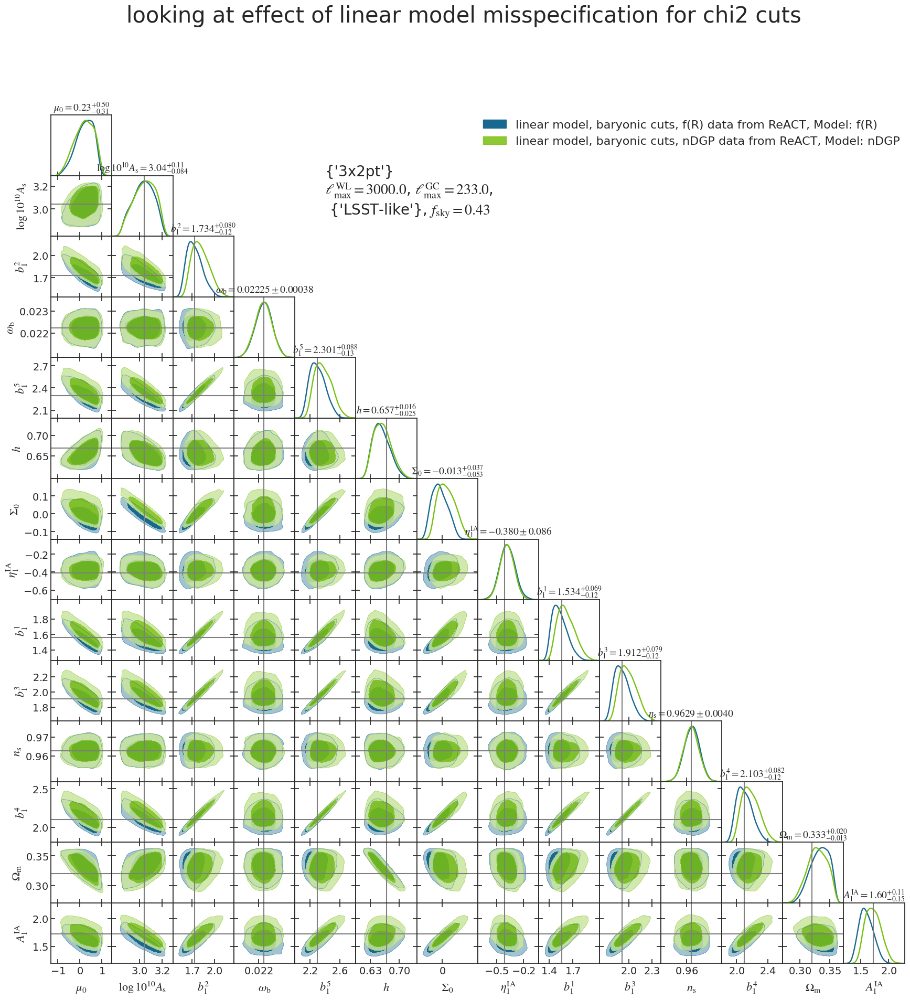

In [53]:
#lsst_y1_muSigmaModel_fRReactData_chi2cuts

file_paths = ['./pca_emcee_runs/chains/chain_lsst_y1_muSigmaModel_fRReactData_chi2cuts_3x2pt.txt', './pca_emcee_runs/chains/chain_lsst_y1_muSigmaModel_nDGPReactData_chi2cuts_3x2pt.txt']


plot_corner(file_paths, 
            additional_labels=["linear model, baryonic cuts, f(R) data from ReACT", "linear model, baryonic cuts, nDGP data from ReACT"],
            title="looking at effect of linear model misspecification for chi2 cuts")


#### Plot showing PCA pseudo (react) with data from react emulators vs external emulators - WL only

Removed no burn in
Removed no burn in


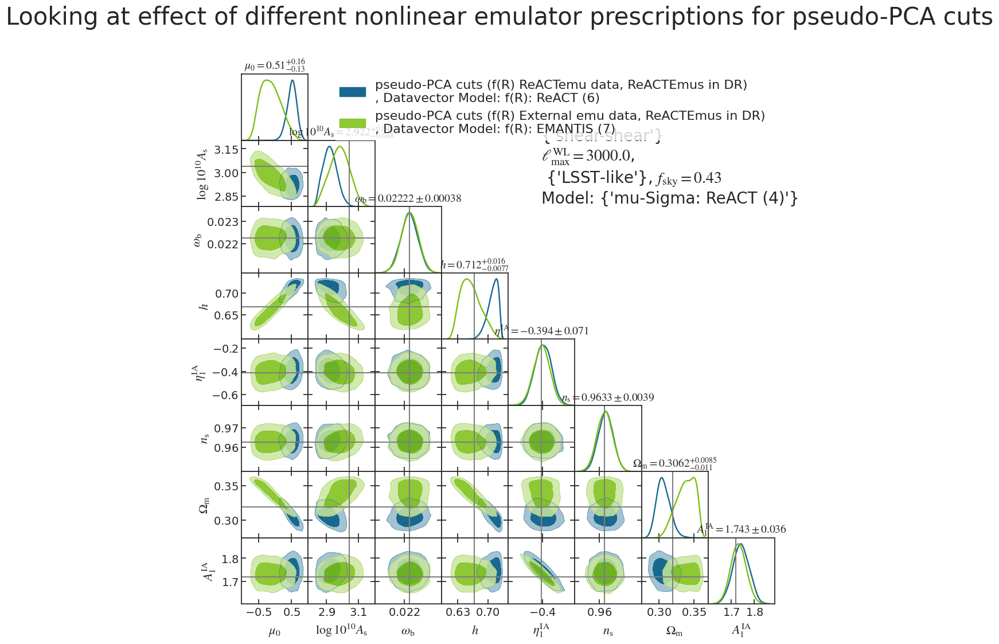

In [ ]:
file_paths = ['./pca_emcee_runs/chains/chain_fR_ReACTEmudat_lsst_y1_pcacuts_ReACTemus_pseudo.txt', 
              './pca_emcee_runs/chains/chain_WL_fR_ExtEmuDat_lsst_y1_pcacuts_pseudo_ReACTEmus.txt']

plot_corner(file_paths,
            additional_labels=["pseudo-PCA cuts (f(R) ReACTemu data, ReACTEmus in DR) \n", "pseudo-PCA cuts (f(R) External emu data, ReACTEmus in DR) \n"],
            title="Looking at effect of different nonlinear emulator prescriptions for pseudo-PCA cuts")

Removed no burn in
Removed no burn in


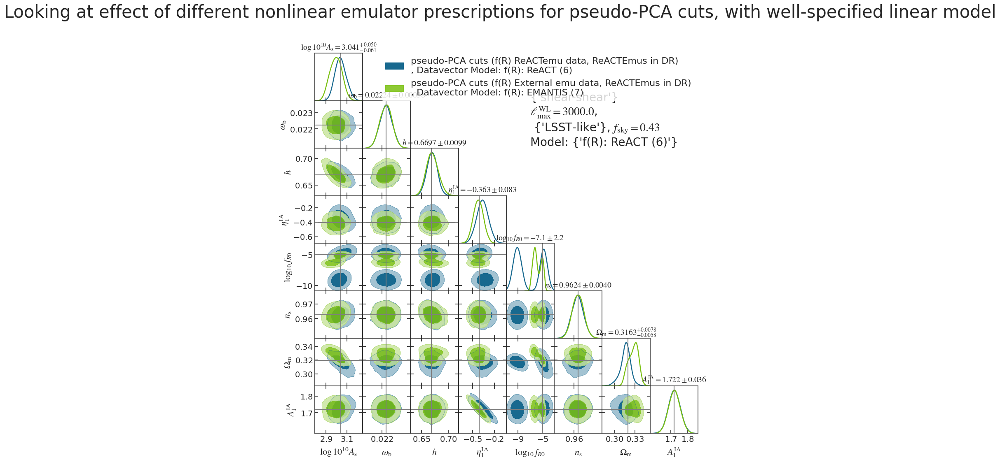

In [ ]:
#chain_WL_reactemu_noparam = np.loadtxt("/home/c2042999/MGLensing/pca_emcee_runs/chains/chain_fR_ReACTEmudat_lsst_y1_pcacuts_ReACTemus_pseudo_Constrain-with-fRpseudo.txt")
#chain_WL_extemu_noparam = np.loadtxt("/home/c2042999/MGLensing/pca_emcee_runs/chains/chain_WL_fR_ExtEmuDat_lsst_y1_pcacuts_pseudo_ReACTEmus_Constrain-with-fRpseudo.txt")
file_paths = ['./pca_emcee_runs/chains/chain_fR_ReACTEmudat_lsst_y1_pcacuts_ReACTemus_pseudo_Constrain-with-fRpseudo.txt',
              './pca_emcee_runs/chains/chain_WL_fR_ExtEmuDat_lsst_y1_pcacuts_pseudo_ReACTEmus_Constrain-with-fRpseudo.txt']

plot_corner(file_paths,
            additional_labels=["pseudo-PCA cuts (f(R) ReACTemu data, ReACTEmus in DR) \n", "pseudo-PCA cuts (f(R) External emu data, ReACTEmus in DR) \n"],
            title="Looking at effect of different nonlinear emulator prescriptions for pseudo-PCA cuts, with well-specified linear model")

Removed no burn in
Removed no burn in


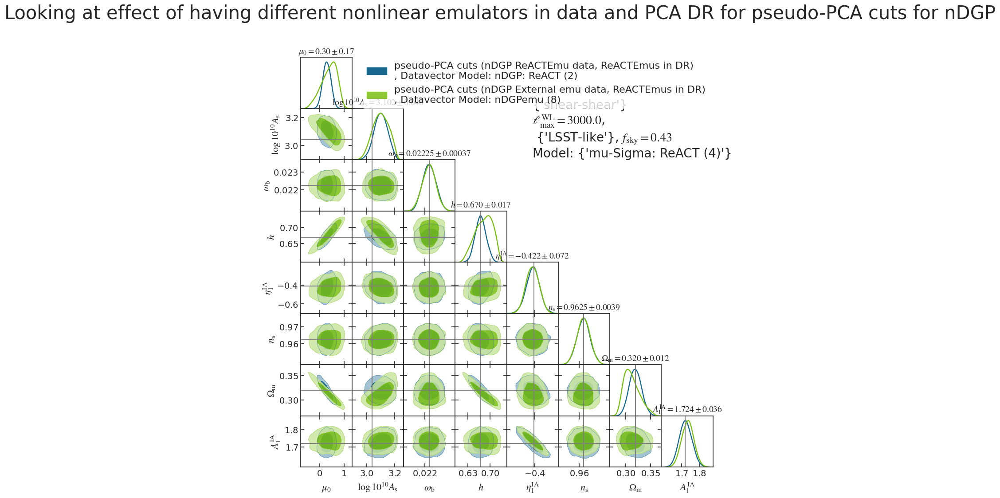

In [98]:


file_paths = ['./pca_emcee_runs/chains/chain_nDGP_ReACTEmudat_lsst_y1_pcacuts_ReACTemus_pseudo.txt',
              './pca_emcee_runs/chains/chain_WL_nDGP_ExtEmuDat_lsst_y1_pcacuts_pseudo_ReACTEmus.txt']

plot_corner(file_paths,
            additional_labels=["pseudo-PCA cuts (nDGP ReACTEmu data, ReACTEmus in DR) \n", "pseudo-PCA cuts (nDGP External emu data, ReACTEmus in DR) \n"],
            title="Looking at effect of having different nonlinear emulators in data and PCA DR for pseudo-PCA cuts for nDGP")

### Plot showing PCA with pseudo in f(R) - comparing 3x2pt and WL only

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


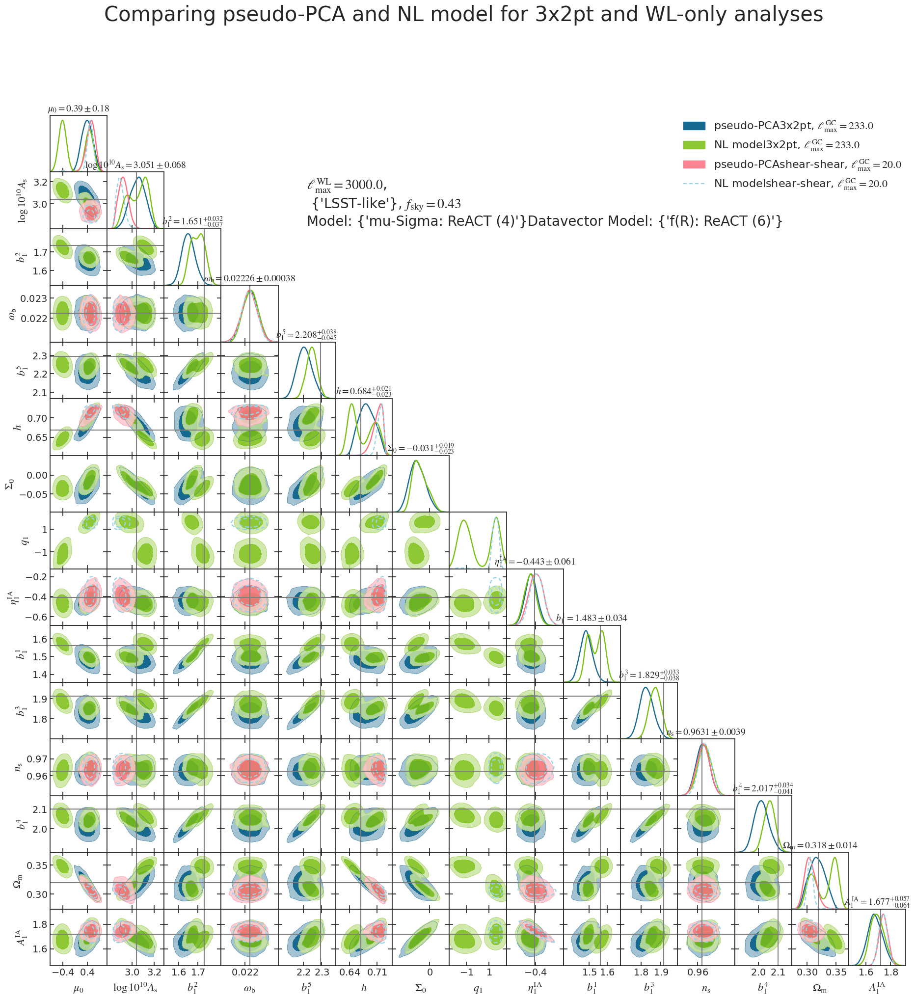

In [100]:
file_paths = ['./pca_emcee_runs/chains/chain_3x2pt_fR_ReACTEmuDat_lsst_y1_pcacuts_pseudo_ReACTEmus.txt',
                './pca_emcee_runs/chains/chain_3x2pt_lsst_y1_NLmodel_fR_ReACTEmuDat.txt',
                './pca_emcee_runs/chains/chain_fR_ReACTEmudat_lsst_y1_pcacuts_ReACTemus_pseudo.txt',
                './pca_emcee_runs/chains/chain_lsst_y1_NLmodel_fR_ReACTEmuDat.txt']

plot_corner(file_paths,
            additional_labels=["pseudo-PCA", "NL model", "pseudo-PCA", "NL model"],
            title="Comparing pseudo-PCA and NL model for 3x2pt and WL-only analyses")


## Finalized Plots

### Plot 1: recover NL modelling and ReACT PCA with same setup - LCDM

Removed no burn in
Removed no burn in


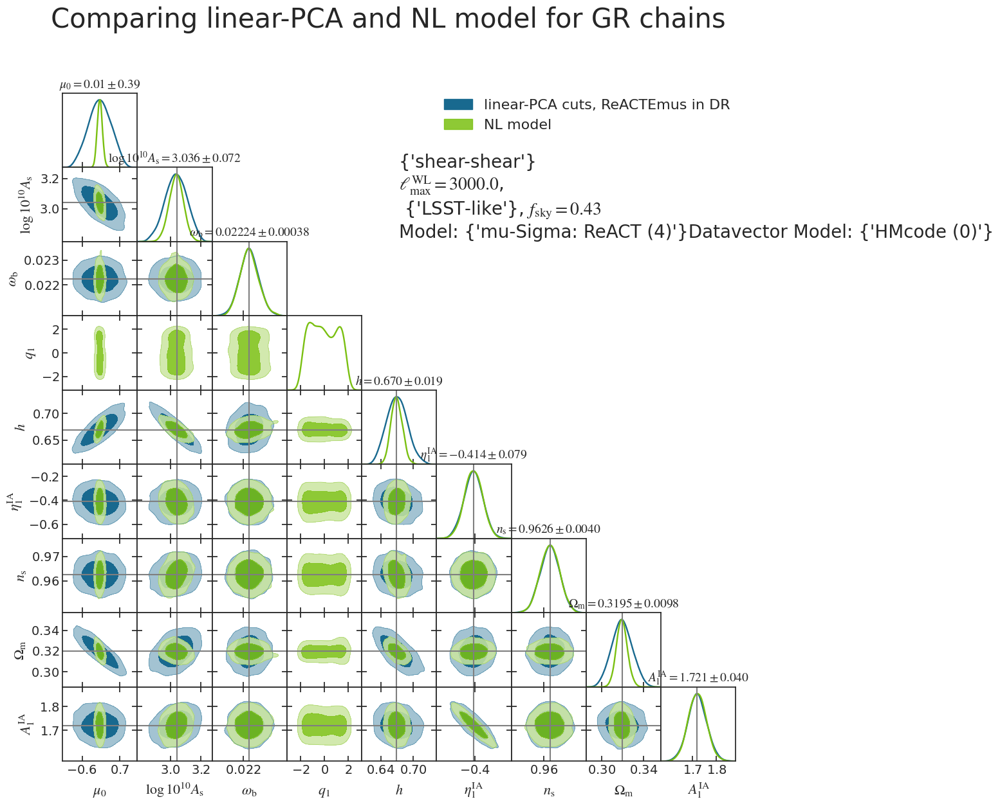

In [104]:
file_paths = ['./pca_emcee_runs/chains/chain_GR_lsst_y1_pcacuts_ReACTemus.txt', './pca_emcee_runs/chains/chain_GR_lsst_y1_NLmodel.txt']

plot_corner(file_paths,
            additional_labels=["linear-PCA cuts, ReACTEmus in DR", "NL model"],
            title="Comparing linear-PCA and NL model for GR chains")

### Plot 2: recover NL modelling and ReACT PCA with same setup - f(R) data from ReACTEmu

Removed no burn in
Removed no burn in


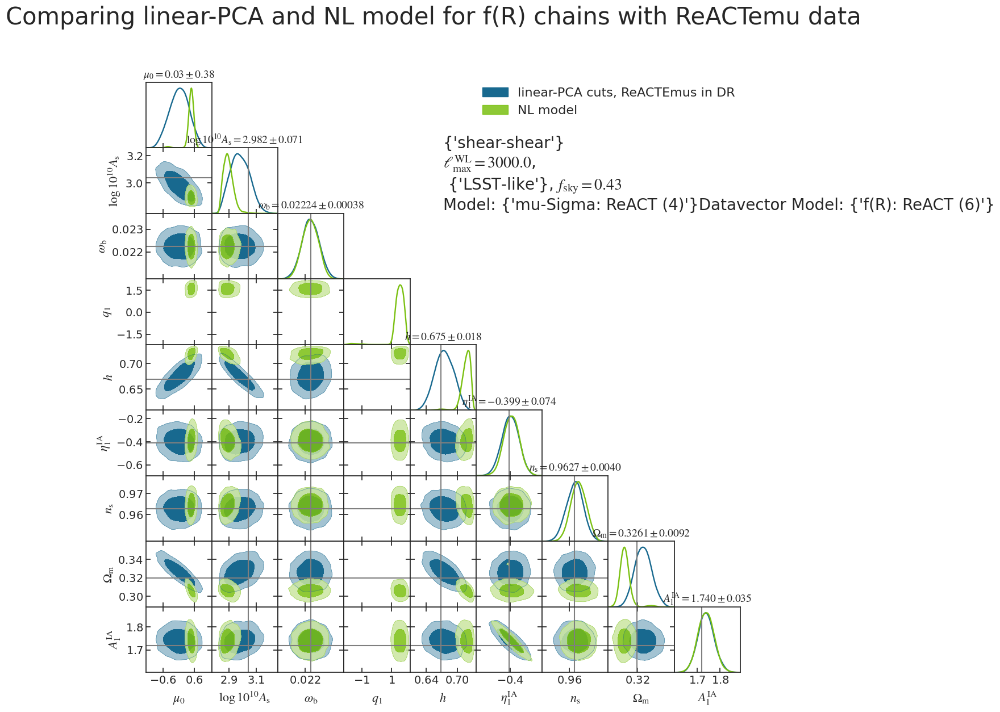

In [105]:
file_paths = ['./pca_emcee_runs/chains/chain_fR_ReACTEmuDat_lsst_y1_pcacuts_ReACTemus.txt', './pca_emcee_runs/chains/chain_lsst_y1_NLmodel_fR_ReACTEmuDat.txt']

plot_corner(file_paths,
            additional_labels=["linear-PCA cuts, ReACTEmus in DR", "NL model"],
            title="Comparing linear-PCA and NL model for f(R) chains with ReACTemu data")

### Plot 3: Compare ReACTEmu PCA with ExtEmu PCA - GR

Removed no burn in
Removed no burn in


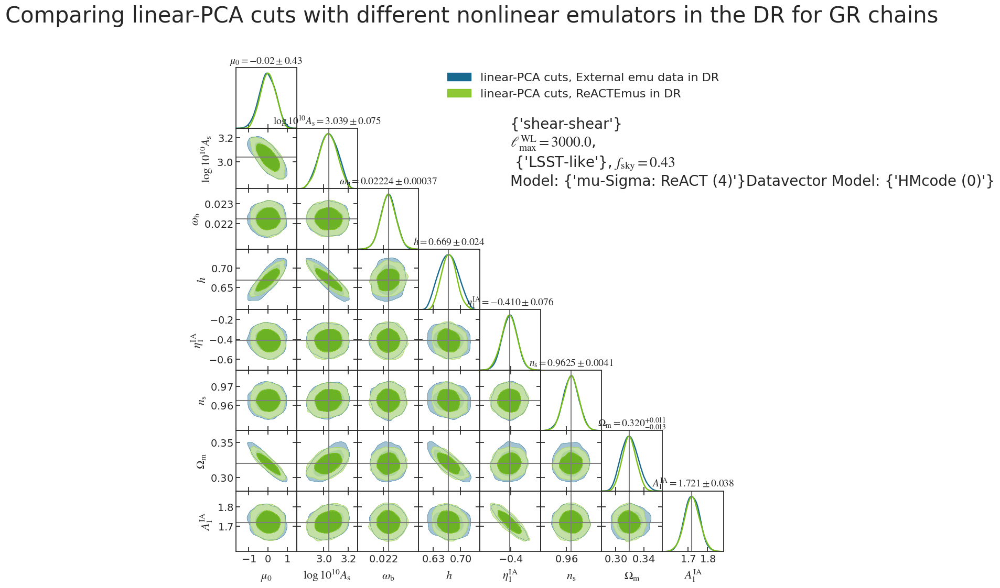

In [106]:
file_paths = ['./pca_emcee_runs/chains/chain_GR_lsst_y1_pcacuts_ext.txt', './pca_emcee_runs/chains/chain_GR_lsst_y1_pcacuts_ReACTemus.txt']

plot_corner(file_paths,
            additional_labels=["linear-PCA cuts, External emu data in DR", "linear-PCA cuts, ReACTEmus in DR"],
            title="Comparing linear-PCA cuts with different nonlinear emulators in the DR for GR chains")

### Plot 4: Compare ReACTEmu PCA with ExtEmu PCA - f(R) data from ReACTEmu

Removed no burn in
Removed no burn in


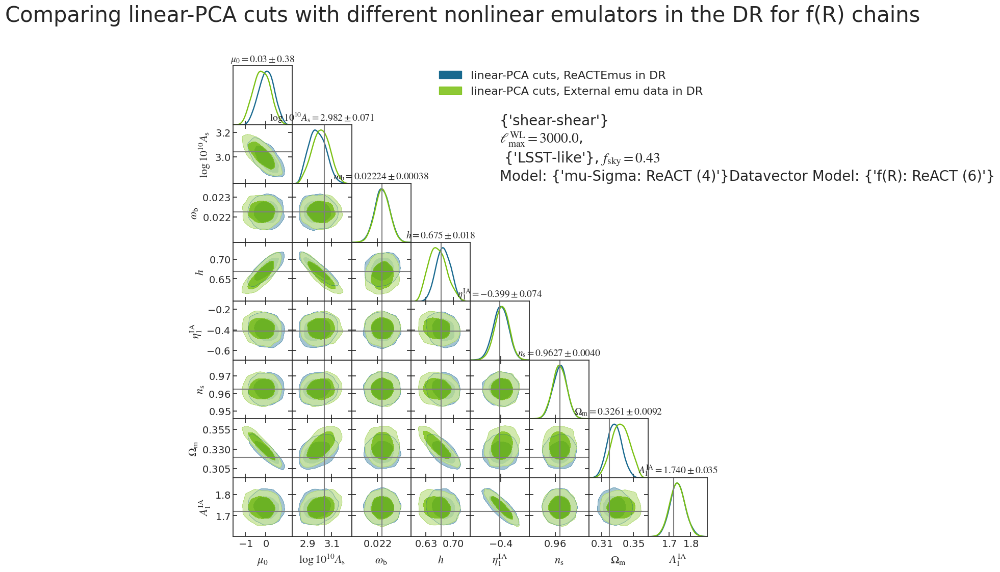

In [107]:
file_paths = ['./pca_emcee_runs/chains/chain_fR_ReACTEmuDat_lsst_y1_pcacuts_ReACTemus.txt', './pca_emcee_runs/chains/chain_fR_ReACTEmuDat_lsst_y1_pcacuts_ExtEmus.txt']

plot_corner(file_paths,
            additional_labels=["linear-PCA cuts, ReACTEmus in DR", "linear-PCA cuts, External emu data in DR"],
            title="Comparing linear-PCA cuts with different nonlinear emulators in the DR for f(R) chains")

### Plot 5: Compare ReACTEmu PCA with f(R) data from ReACTEmu vs. from ExtEmu

Removed no burn in
Removed no burn in


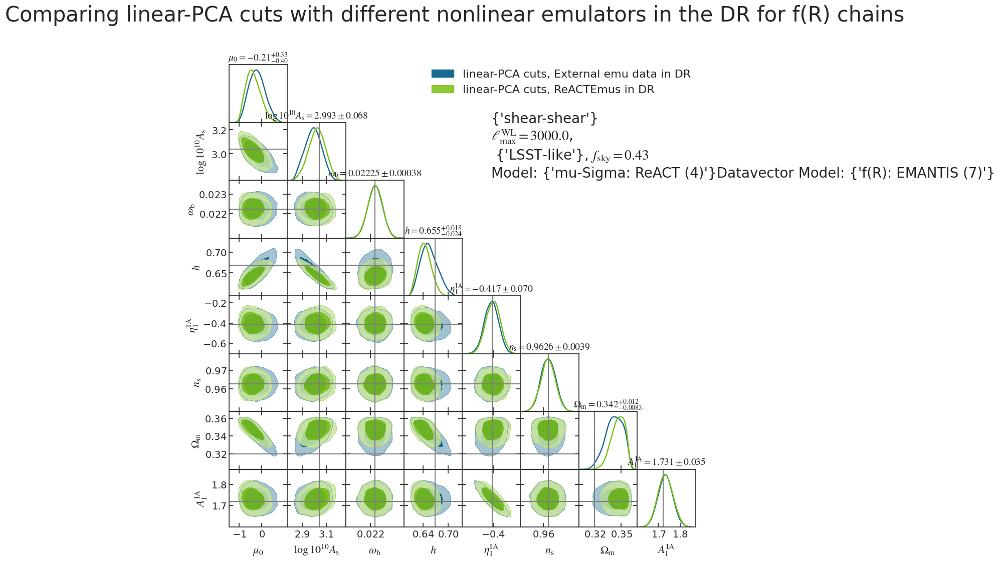

In [108]:
file_paths = ['./pca_emcee_runs/chains/chain_fR_ExtEmuDat_lsst_y1_pcacuts_ExtEmus.txt', './pca_emcee_runs/chains/chain_fR_ExtEmuDat_lsst_y1_pcacuts_ReACTemus.txt']

plot_corner(file_paths,
             additional_labels=["linear-PCA cuts, External emu data in DR", "linear-PCA cuts, ReACTEmus in DR"],
             title="Comparing linear-PCA cuts with different nonlinear emulators in the DR for f(R) chains")


### Plot 6: Compare ReACTEmu PCA with nDGP data from ReACTEmu vs. from ExtEmu

Removed no burn in
Removed no burn in


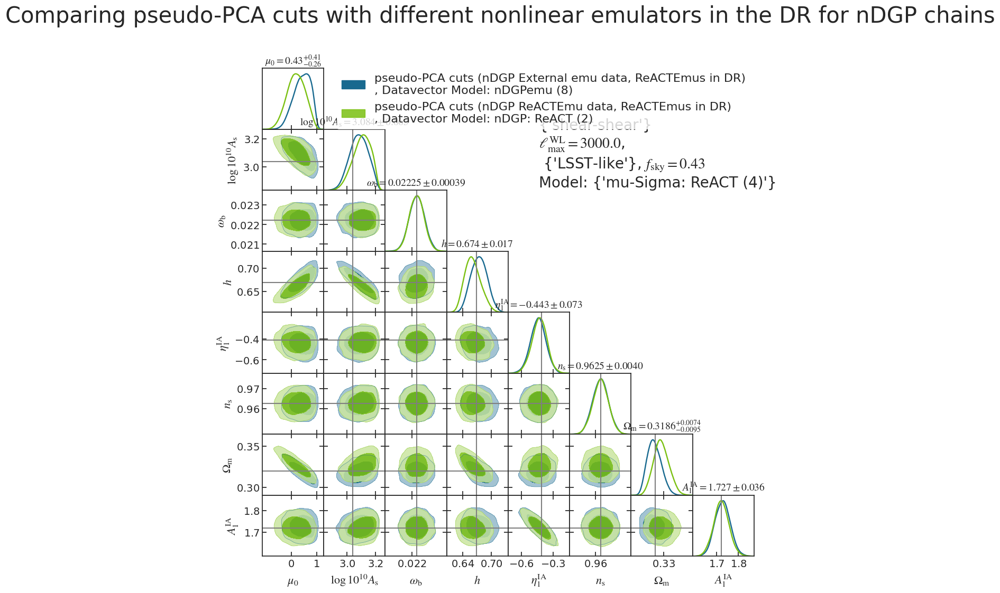

In [109]:
file_paths = ['./pca_emcee_runs/chains/chain_nDGP_ExtEmuDat_lsst_y1_pcacuts_ReACTemus.txt', './pca_emcee_runs/chains/chain_nDGP_ReACTEmuDat_lsst_y1_pcacuts_ReACTemus.txt'] 

plot_corner(file_paths,
            additional_labels=["pseudo-PCA cuts (nDGP External emu data, ReACTEmus in DR) \n", "pseudo-PCA cuts (nDGP ReACTEmu data, ReACTEmus in DR) \n"],
            title="Comparing pseudo-PCA cuts with different nonlinear emulators in the DR for nDGP chains")

### Plot 11: 3x2pt, Pseudo power spectrum for PCA, GR

Removed no burn in
Removed no burn in


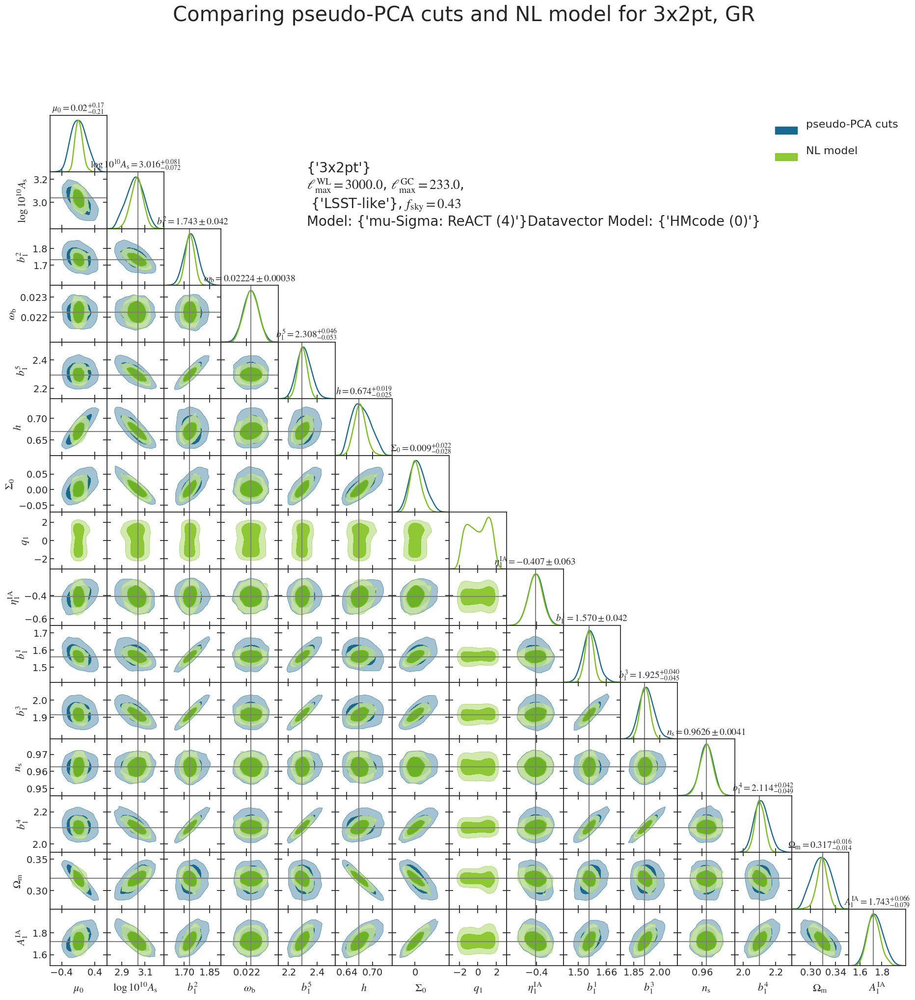

In [110]:
# Datavector is from ReACT, analysis is with ReACTEmus
file_paths = ['./pca_emcee_runs/chains/chain_3x2pt_GR_ReACTEmuDat_lsst_y1_pcacuts_pseudo_ReACTEmus.txt',
              './pca_emcee_runs/chains/chain_3x2pt_lsst_y1_NLmodel_GR_ReACTEmuDat.txt']

plot_corner(file_paths,
            additional_labels=["pseudo-PCA cuts \n", "NL model  \n"],
            title="Comparing pseudo-PCA cuts and NL model for 3x2pt, GR")


### Plot 10: 3x2pt, Pseudo power spectrum for PCA, f(R)

Removed no burn in
Removed no burn in


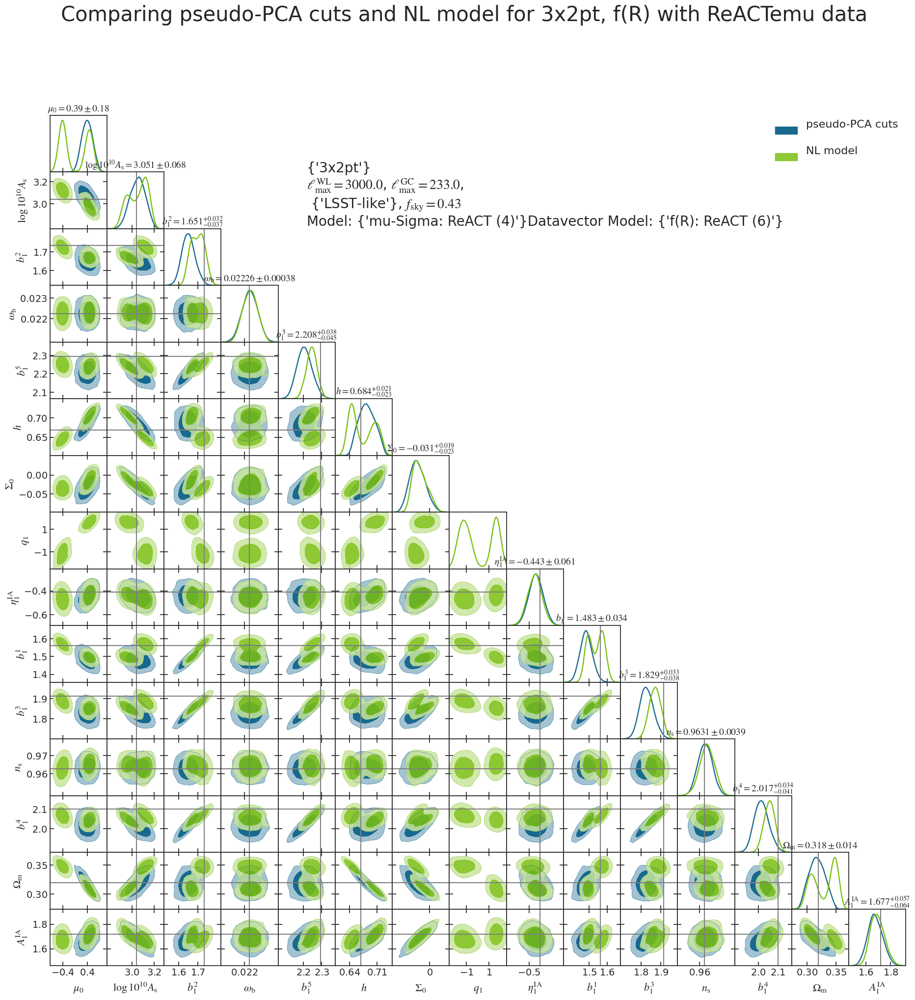

In [111]:
# Datavector is from ReACT, analysis is with ReACTEmus 
file_paths = ['./pca_emcee_runs/chains/chain_3x2pt_fR_ReACTEmuDat_lsst_y1_pcacuts_pseudo_ReACTEmus.txt',
                './pca_emcee_runs/chains/chain_3x2pt_lsst_y1_NLmodel_fR_ReACTEmuDat.txt']

plot_corner(file_paths,
            additional_labels=["pseudo-PCA cuts \n", "NL model  \n"],
            title="Comparing pseudo-PCA cuts and NL model for 3x2pt, f(R) with ReACTemu data")

### Plot 9: 3x2pt, Pseudo power spectrum for PCA, nDGP

Removed no burn in
Removed no burn in


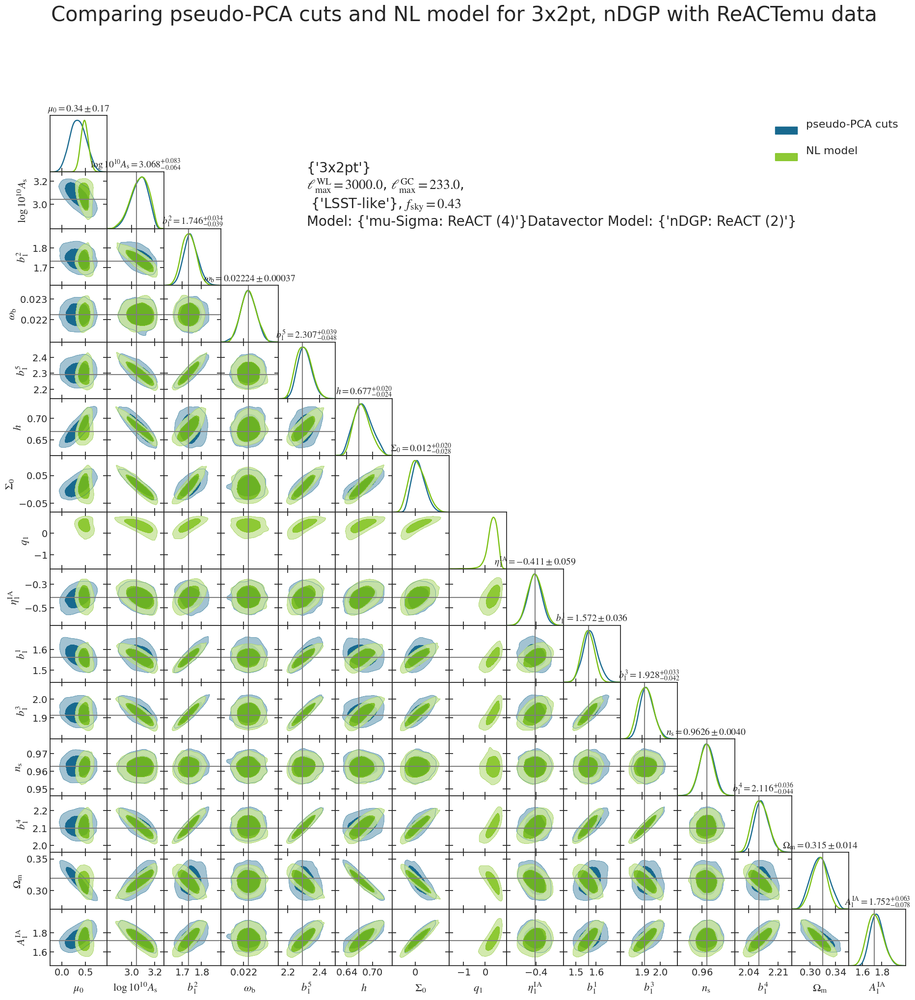

In [112]:
# Datavector is from ReACT, analysis is with ReACTEmus 

file_paths = ['./pca_emcee_runs/chains/chain_3x2pt_nDGP_ReACTEmuDat_lsst_y1_pcacuts_pseudo_ReACTEmus.txt',
              './pca_emcee_runs/chains/chain_3x2pt_lsst_y1_NLmodel_nDGP_ReACTEmuDat.txt']

plot_corner(file_paths,
            additional_labels=["pseudo-PCA cuts \n", "NL model  \n"],
            title="Comparing pseudo-PCA cuts and NL model for 3x2pt, nDGP with ReACTemu data")



### Plots 8a: PCA Pseudo Linear Model misspecification sensitivity

Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in
Removed no burn in


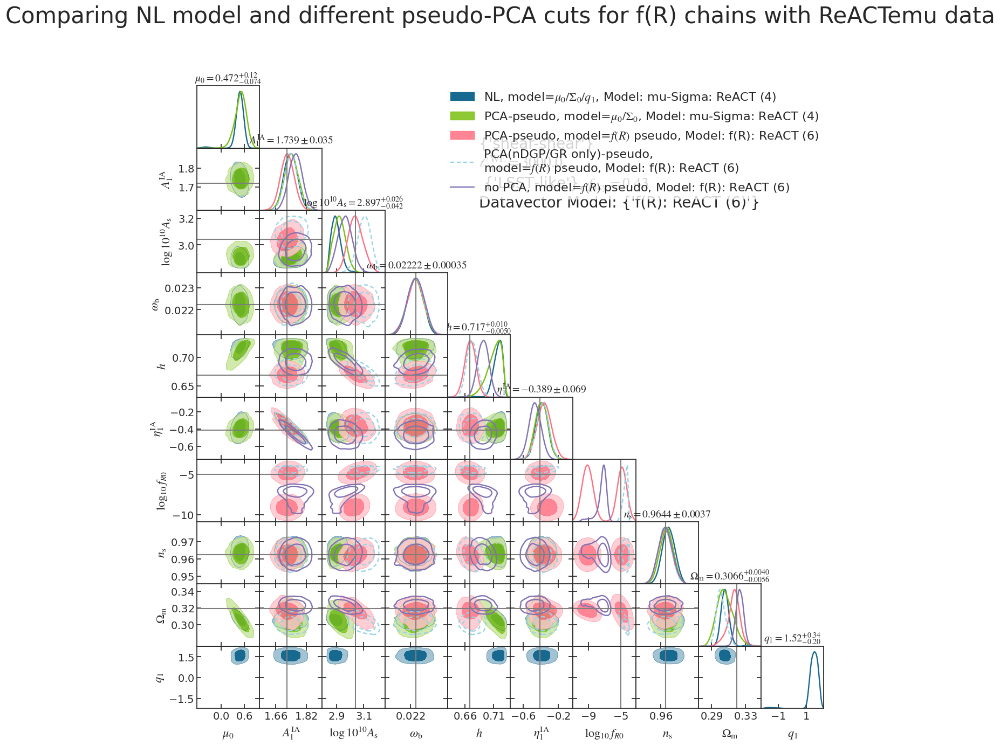

In [113]:

file_paths = ['./pca_emcee_runs/chains/chain_lsst_y1_NLmodel_fR_ReACTEmuDat.txt',
                './pca_emcee_runs/chains/chain_fR_ReACTEmudat_lsst_y1_pcacuts_ReACTemus_pseudo.txt',
                './pca_emcee_runs/chains/chain_fR_ReACTEmudat_lsst_y1_pcacuts_ReACTemus_pseudo_Constrain-with-fRpseudo.txt',
                './pca_emcee_runs/chains/chain_fR_ReACTEmudat_nDGPGRonly_lsst_y1_pcacuts_ReACTemus_pseudo_Constrain-with-fRpseudo.txt',
                './pca_emcee_runs/chains/chain_lsst_y1_pseudomodelfRReactPseudo_fRReactData.txt']

plot_corner(file_paths,
            additional_labels=["NL, model=$\mu_0/\Sigma_0/q_1$", "PCA-pseudo, model=$\mu_0/\Sigma_0$", "PCA-pseudo, model=$f(R)$ pseudo", "PCA(nDGP/GR only)-pseudo,"+"\n"+r"model=$f(R)$ pseudo", "no PCA, model=$f(R)$ pseudo"],
            title="Comparing NL model and different pseudo-PCA cuts for f(R) chains with ReACTemu data")

### Random Pseudo Plots: Pseudo power spectrum for PCA, WL only

Removed no burn in
Removed no burn in
Removed no burn in


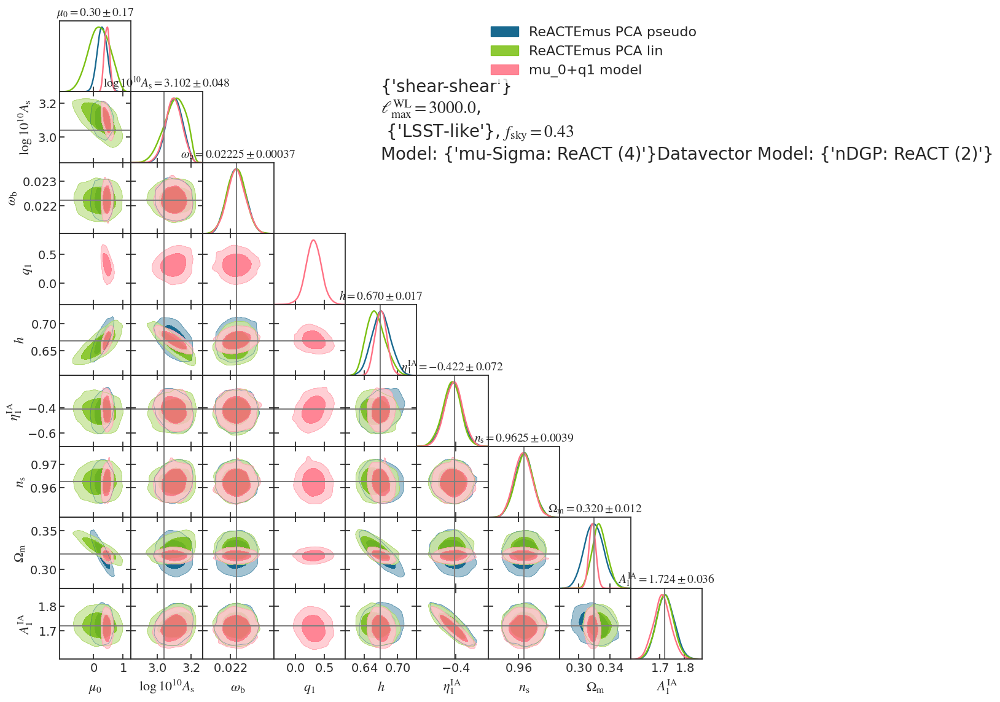

In [114]:
# Datavector is from ReACT, analysis is with ReACTEmus 
chain_raw_1 = np.loadtxt("/home/c2042999/MGLensing/pca_emcee_runs/chains/chain_nDGP_ReACTEmudat_lsst_y1_pcacuts_ReACTemus_pseudo.txt")
chain_RE = np.concatenate((chain_raw_1[:,:-4], 1e-5*np.random.randn(len(chain_raw_1),1), chain_raw_1[:,-4:]), axis=1)

chain_raw_2 = np.loadtxt("/home/c2042999/MGLensing/pca_emcee_runs/chains/chain_nDGP_ReACTEmuDat_lsst_y1_pcacuts_ReACTemus.txt")
chain_new = np.concatenate((chain_raw_2[:,:-4], 1e-5*np.random.randn(len(chain_raw_2),1), chain_raw_2[:,-4:]), axis=1)


chain_NL = np.loadtxt("/home/c2042999/MGLensing/pca_emcee_runs/chains/chain_lsst_y1_NLmodel_nDGP_ReACTEmuDat.txt")

file_paths = ['./pca_emcee_runs/chains/chain_nDGP_ReACTEmudat_lsst_y1_pcacuts_ReACTemus_pseudo.txt',
                './pca_emcee_runs/chains/chain_nDGP_ReACTEmuDat_lsst_y1_pcacuts_ReACTemus.txt',
                './pca_emcee_runs/chains/chain_lsst_y1_NLmodel_nDGP_ReACTEmuDat.txt']

plot_corner(file_paths,
            additional_labels=["ReACTEmus PCA pseudo","ReACTEmus PCA lin", "mu_0+q1 model"])

### Plots 7: Screening instead of Emus

Removed no burn in
Removed no burn in


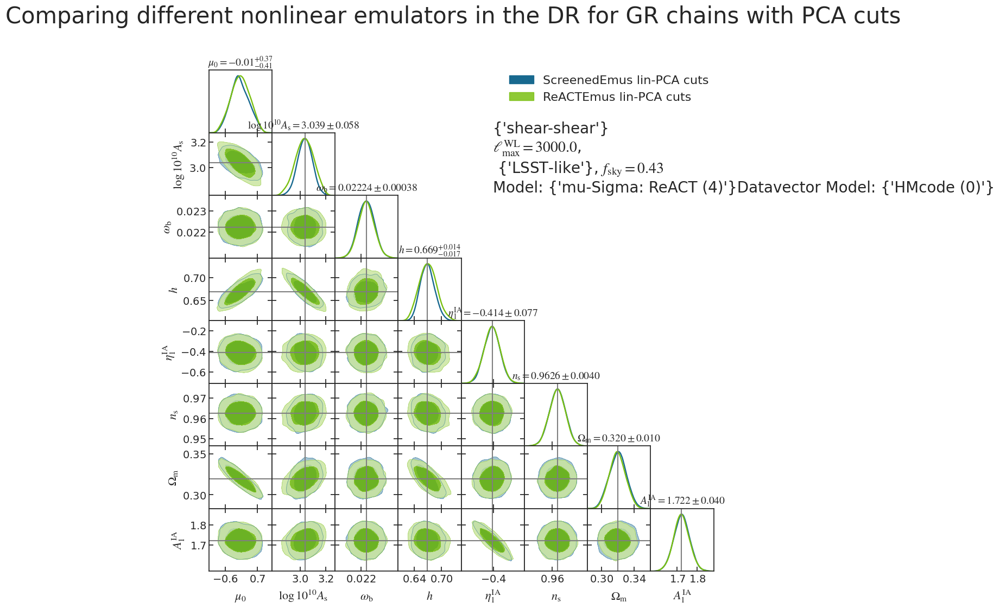

In [115]:
# Datavector is from ReACT, analysis is with ReACTEmus 
file_paths = ['./pca_emcee_runs/chains/chain_GR_lsst_y1_pcacuts_ScreenedEmus.txt',
                './pca_emcee_runs/chains/chain_GR_lsst_y1_pcacuts_ReACTemus.txt']

plot_corner(file_paths,
            additional_labels=["ScreenedEmus lin-PCA cuts", "ReACTEmus lin-PCA cuts"],
            title="Comparing different nonlinear emulators in the DR for GR chains with PCA cuts")

Removed no burn in
Removed no burn in
Removed no burn in


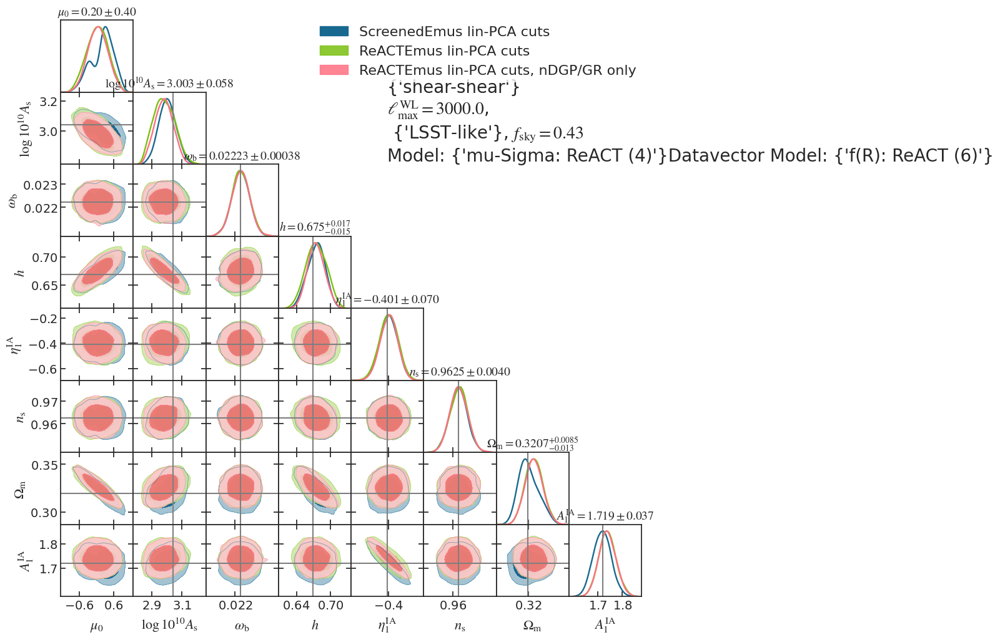

In [116]:
# Datavector is from ReACT, analysis is with ReACTEmus 

file_paths = ['./pca_emcee_runs/chains/chain_fR_ReACTEmuDat_lsst_y1_pcacuts_ScreenedEmus.txt',
                './pca_emcee_runs/chains/chain_fR_ReACTEmuDat_lsst_y1_pcacuts_ReACTemus.txt',
                './pca_emcee_runs/chains/chain_fR_lsst_y1_pcacuts_ReACTemus_nDGPandGRonly.txt']

plot_corner(file_paths,
            additional_labels=["ScreenedEmus lin-PCA cuts", "ReACTEmus lin-PCA cuts", "ReACTEmus lin-PCA cuts, nDGP/GR only"])

Removed no burn in
Removed no burn in


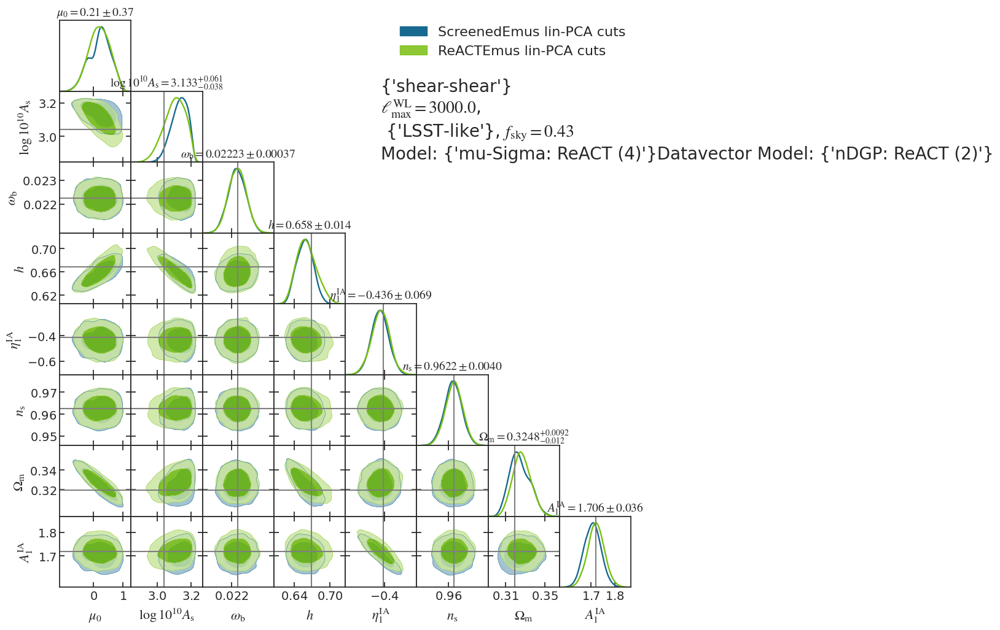

In [117]:
# Datavector is from ReACT, analysis is with ReACTEmus 

file_paths = ['./pca_emcee_runs/chains/chain_nDGP_ReACTEmuDat_lsst_y1_pcacuts_ScreenedEmus.txt',
                './pca_emcee_runs/chains/chain_nDGP_ReACTEmuDat_lsst_y1_pcacuts_ReACTemus.txt']

plot_corner(file_paths,
            additional_labels=["ScreenedEmus lin-PCA cuts", "ReACTEmus lin-PCA cuts"])